In [ ]:
import numpy as np
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
import imageio
import time
from sklearn.manifold import TSNE
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from IPython.display import Image

# Лабораторная работа: обучение многообразий

# PCA

В этом блоке вам предстоит выполнить задания, касающиеся метода главных компонент (`PCA`).

## Теоретическая часть

Пусть на вход подаются центрированные данные
$$
x_i = \begin{pmatrix}
x_{i1} \\ x_{i2} \\ \vdots \\ x_{ip}
\end{pmatrix} \in \mathbb R^{p \times 1}, \quad i \in \{1, \ldots, n\}, \quad \sum\limits_{i = 1}^n x_i = 0.
$$
Пусть также $X$ — матрица размера $n \times p$ — матрица объекты-признаки (внимание: объекты расположены в матрице $X$ по строкам), $W$ – матрица размера $p \times l$ из ортонормированных базисных векторов (их координаты записаны по столбцам) линейного подпространства $\mathbb R^l$ пространства $\mathbb R^p$, в которое мы хотим «вложить» исходные объекты, $Z$ — матрица размера $n \times l$ — матрица координат старых объектов в новом базисе. Мы определили функцию потерь ($l_2$-потери) следующим образом:

$$
L(W) = \|X^T - WZ^T\|^2_F = \sum\limits_{i = 1}^n \|x_i - Wz_i\|^2.
$$

На лекции мы обсудили построение первой главной компоненты, минимизируя выражение

$$
L(W) = \sum\limits_{i = 1}^n\|x_i - w_1z_{i1}\|^2.
$$

При условии, что $w_1^Tw_1 = 1$, мы получили, что

$$
z_{i1} = x_i^Tw_1,
$$

то есть что новая координата есть проекция на $w_1$, и что $w_1$ — собственный вектор выборочной ковариационной матрицы

$$
\Sigma = \frac{1}{n}X^TX,
$$

отвечающей наибольшему собственному значению.



## Задача 1

Вам требуется построить первые две главные компоненты, объяснить сособ их получения, а также их геометрический и статистический смыслы. Для этого:

1.   Составьте минимизируемый функционал.
2.   Докажите, что новые координаты (счеты) — это проекции исходных данных на соотвествующие векторы $w_1$, $w_2$.
3. Докажите, что $w_1$, $w_2$ — это собственные векторы выборочной ковариационной матрицы, отвечающие двум наибольшим собственным значениям, по убыванию, соответственно.
4. Покажите, что статистический смысл упомянутых выше собственных чисел — значение выборочных дисперсий соответствующих (новых) координат.

**Решение:**

1. Миниизируемый функционал:
$$
L(W) = \|X^T - WZ^T\|^2_F = \sum\limits_{i = 1}^n\|x_i - Wz_{i}\|^2
$$

2. Доказательство явления проекциями:
$$
L(W) = \sum\limits_{i = 1}^n\|x_i - Wz_{i}\|^2 = \sum\limits_{i = 1}^n(x_i - Wz_i)^T(x_i - Wz_i) =\sum\limits_{i = 1}^n(x_i^Tx_i - x_i^TWz_i-z_i^TW^Tx_i+z_i^TW^TWz_i) = \ \ //{применим} \ условия: w_i^Tw_i=1,\ w_i^Tw_j = 0=>W^TW=E//=\sum\limits_{i = 1}^n(x_i^Tx_i-2z_i^TW^Tx_i+z_i^Tz_i)
$$
Откуда получаем в общем виде:
$$
\frac{\partial L}{\partial z_i} = -2W^Tx_i + 2z_i
$$

$$
z_i = W^Tx_i
$$
Для 2-х компонент:
$$
z_{i1} = w_1^Tx_i,\ z_{i2} = w_2^Tx_i
$$

3. \\

$
L(W) = \sum\limits_{i = 1}^n\|x_i - w_1 z_{i1} - w_2 z_{i2}\|^2 = \sum\limits_{i = 1}^n(x_i - w_1 z_{i1} - w_2 z_{i2})^T(x_i - w_1 z_{i1} - w_2 z_{i2}) =\sum\limits_{i = 1}^n(x_i^Tx_i - x_i^Tw_1z_{i1} - x_i^Tw_2z_{i2} - z_{i1}w_1^Tx_i + z_{i1} w_1^Tw_1z_{i1} + z_{i1} w_1^Tw_2z_{i2} - z_{i2}w_2^Tx_i + z_{i2} w_2^Tw_1z_{i1} + z_{i2} w_2^Tw_2z_{i2})
$

$
Применим\ сразу \  w_2^Tw_1 = 0,\ w_1^Tw_1 = 1, \ z_{ij} = w_j^Tx_i
$

$
L(W) = \sum\limits_{i = 1}^n(x_i^Tx_i - 2z_{i1}x_i^Tw_1 - 2z_{i2}x_i^Tw_2 - z_{i1}^2 - z_{i2}^2) = \sum\limits_{i = 1}^n(x_i^Tx_i - 2w_1^Tx_ix_i^Tw_1 - 2w_2^Tx_ix_i^Tw_2 + w_1^Tx_i x_i^T w_1 + w_2^Tx_i x_i^T w_2) = \sum\limits_{i = 1}^n(x_i^Tx_i - w_1^Tx_ix_i^Tw_1 - w_2^Tx_ix_i^Tw_2) → min ⇔ \sum\limits_{i = 1}^n(w_1^Tx_ix_i^Tw_1 + w_2^Tx_ix_i^Tw_2) → max
$


Напишем Лагранжиан при условии ортонормированности векторов счетов:
$
Lagr = (w_1^T Σ w_1 + w_2^T Σ w_2) - λ_1(w_1^T w_1 - 1) - λ_2(w_2^T w_2 - 1) - λ_3(w_1^T w_2)
$

$
\frac{\partial Lagr}{\partial w_1} = 2Σw_1 - 2λ_1w_1 - λ_3w_2 = 0
$

$
\frac{\partial Lagr}{\partial w_2} = 2Σw_2 - 2λ_2w_2 - λ_3w_1 = 0
$

Умножим слева первое выражение на вектор $w_2^T$:


$
2w_2^T Σ w_1 - 2λ_1 w_2^T w_1 - λ_3 w_2^T w_2 =0 \\ так\ как\ w_2^T w_1 = 0: \\ получаем\  λ_3 = 0 \\
Откуда\ w_1,\ w_2\ -\ это\ собственные\ векторы\ матрицы\ ковариации:\\
Σw_1 = λ_1w_1,\ Σw_2 = λ_2w_2 \\
Условие\ максимума\ преобразууется:\\
w_1^T Σ w_1 + w_2^T Σ w_2 = λ_1 + λ_2
$

Отсюда видно, что $λ_1,\ λ_2$ должны соответсвовать максимальным собственным числам матрицы ковариаций.

4. \\
$
S^2(z_{1}) = \frac{1}{n}\sum_1^nz_{i1}^2 = \frac{1}{n}\sum_1^n z_{i1}^2 = \frac{1}{n}\sum_1^n (w_1^Tx_ix_i^Tw_1) = λ_1
$

Аналогично для $z_2$

## Задача 2

Предыдущий подход хорошо работает в случае, когда $n$ сильно больше $p$. В противном случае разумнее рассматривать тоже симметричную матрицу $XX^T$. Ваша задача, взяв конкретную матрицу $X$ (скажем, размера $3 \times 3$, но можно и в общем виде), показать, что

1.   Существует ортогональная матрица $U$, что

$$
U^TXX^TU = \Lambda,
$$

где последняя матрица — диагональная.

2.   Верно равенство

$$
XX^TU = U \Lambda,
$$

а значит и равенство

$$
X^TXX^TU = X^TU \Lambda,
$$

откуда

$$
(X^TX)(X^TU) = X^TU \Lambda
$$

и $X^TU$ — матрица из собственных векторов для $X^TX$.

3. Показать, что столбцы матрицы $X^TU$ ортогональны, но не ортонормированы.

4. Найти нормы столбцов $X^TU$, привести преобразование к ортогональному. Получить аналог `PCA`.

5. Показать численно (на конкретной матрице) с использованием, например, `numpy`.

**Решение:**

1.


Матрица $XX^T = C$ - симметричная. Симметричная матрица является ортогонально диагоналилизируемой. Также это следует из сингулярного разложения для симметричной матрицы. Так как:
$$
C = U \Sigma V^T,
$$
где матрица $U$ ортогональная и ее столбцы являются собственными векторами матрицы $CC^T$, а $V$ ортогональная матрица, столбцы которой есть собственные векторы матрицы $C^TC$. В силу симметричности $C$ матрицы $CC^T$ и $C^TC$ совпадают. И следовательно совпадают $U$ и $V$

2.


Умножим слева на $U$:
$$
UU^TXX^TU = XX^TU = U \Lambda,
$$

Умножим слева на $X^T$:

$$
X^TXX^TU = X^TU \Lambda,
$$

откуда:

$$
(X^TX)(X^TU) = (X^TU) \Lambda
$$

$i$-й столбец матрицы левого выражения есть действие оператора $X^TX$ на столбец матрицы $X^TU$ - $c_i$,

а $i$-й столбец правого выражения $X^TU \Lambda$ есть умножение столбца $c_i$ на диагональной элемент матрицы на позиции $(i,i)$:

$$
(X^TX)c_i = c_i \lambda_i
$$

Откуда столбцы матрицы $X^TU$ есть собственные вектора матрицы $X^TX$

3.

Факт ортогональности столбцов матрицы $X^TU$ следует прямо из выражения для симметричной матрицы и из ассоциативности матричного умножения:
$$
U^TXX^TU = (X^TU)^T(X^TU) = \Lambda,
$$

где $\Lambda$ - диагональная.

Матрица $\Lambda$ в общем случае не обязана быть единичной. Поэтому столбцы матрицы $X^TU$ не обязаны быть ортонормированными.

4.

Из начального выражения:
$$
\begin{cases}
ux_i^Tux_i = ||ux_i||^2 = \lambda_i \\
ux_i^Tux_j=0,
\end{cases}
$$
где $\lambda_i$ - диагональный элемент матрицы $\Lambda$ на позиции $(i,i)$.

Откуда: $ \frac{||ux_i||} {\sqrt\lambda_i}=1$

Тогда преобразование станет ортогональным при умножении справа на $\sqrt\Lambda^{-1}$:

$X^TU \sqrt\Lambda^{-1}$ - ортогональное преобразование

Получили:
$$
(X^TU \sqrt\Lambda^{-1})^T(X^TU \sqrt\Lambda^{-1}) = \sqrt\Lambda^{-1} (X^TU)^T (X^TU)\sqrt\Lambda^{-1} = \sqrt\Lambda^{-1} \Lambda \sqrt\Lambda^{-1} = E
$$

Столбцы матрицы $X^TU \sqrt\Lambda^{-1}$ ортонормированные собственные вектора ковариационной матрицы $X^TX$

В силу того, что векторы счетов в PCA есть
ортонормированные собственные векторы матрицы ковариации, мы получили аналог PCA.


5.

In [ ]:
# Задаем матрицу X
X = np.array([[1, 2, 3],
              [4, 7, 6],
              [7, 8, 10]])

# Вычисляем C = XX^T
C = X @ X.T

# Находим собственные значения и собственные векторы
eigenvalues, eigenvectors = np.linalg.eig(C)

# Ортогонализируем собственные векторы
U = eigenvectors
U_normalized = U / np.linalg.norm(U, axis=0)

# Проверяем равенство U^TXX^TU = Λ
Lambda = np.diag(eigenvalues)
result1 = U.T @ X @ X.T @ U

# Проверяем равенство X^TX(X^TU) = X^TUΛ
Y = X.T @ U
result3 = (X.T @ X) @ Y
result4 = Y @ Lambda

# Ортогональное преобразование

D = np.diag(eigenvalues)

Y_ort = Y @ np.linalg.inv(np.sqrt(D))


# Выводим результаты
print("Матрица C")
for k in C:
    print(k)
print("Собственные значения:", eigenvalues)
print("Собственные векторы матрицы XXT:")
print(eigenvectors)


print("U^TXX^TU=")
for k in result1:
    print(k)


print("X^TX(X^TU)=")
for k in result3:
    print(k)
print("X^TUΛ=")
for k in result4:
    print(k)

print("Нормы столбцов Y = X.T U=", np.linalg.norm(Y, axis=0))

print("Ортогональное преобразование Y_ort = X.T @ U @ inv(sqrt(D))")
print(Y_ort)

print("Норма ортогонализированного преобразования:")
print(np.linalg.norm(Y_ort, axis=1))

Матрица C
[14 36 53]
[ 36 101 144]
[ 53 144 213]
Собственные значения: [324.71690874   0.76409559   2.51899568]
Собственные векторы матрицы XXT:
[[ 0.20195175  0.97249172  0.11608339]
 [ 0.55286078 -0.01536097 -0.83313204]
 [ 0.80843085 -0.23243043  0.54075471]]
U^TXX^TU=
[ 3.24716909e+02  4.97379915e-14 -2.84217094e-14]
[ 5.43176615e-14  7.64095586e-01 -1.38777878e-16]
[-1.99840144e-14  5.55111512e-17  2.51899568e+00]
X^TX(X^TU)=
[ 2.62124830e+03 -5.47065800e-01  1.43290093e+00]
[ 3.48790635e+03 -1.67999733e-02 -3.20849475e+00]
[3.89898259e+03 3.82815773e-01 1.90689235e+00]
X^TUΛ=
[ 2.62124830e+03 -5.47065800e-01  1.43290093e+00]
[ 3.48790635e+03 -1.67999733e-02 -3.20849475e+00]
[3.89898259e+03 3.82815773e-01 1.90689235e+00]
Нормы столбцов Y = X.T U= [18.01990313  0.87412561  1.58713442]
Ортогональное преобразование Y_ort = X.T @ U @ inv(sqrt(D))
[[ 0.44797193 -0.81906436  0.3584058 ]
 [ 0.59608399 -0.02515284 -0.80252801]
 [ 0.66633702  0.57314999  0.47696339]]
Норма ортогонализирова

## Практическая часть

Рассмотрим применение `PCA` в разрезе работы с зашумленными данными. Наша цель — выяснить, можно ли при помощи метода каким-то образом избавляться от шума в данных. Прежде чем двигаться дальше к конкретике, предположите, осуществимо ли это и, если ответ положительный, попробуйте предложить конкретный способ (с обоснованием).

Предположим следующую ситуацию: решается задача классификации, есть некоторый тренировочный набор данных (эталонный, возможно синтетический), на котором обучается модель классификации. Данные же для предсказания поступают в некотором "зашумленном" виде: например, барахлит датчик/некачественная аппаратура/проблемы канала передачи данных, etc. Для повышения качества классификации разумно попробовать избавиться от шума в данных. Попробуем смоделировать такую ситуацию.

**Примечание:** в качества классификатора будет выступать [логистическая регрессия](https://scikit-learn.org/1.5/modules/generated/sklearn.linear_model.LogisticRegression.html). В рамках этой работы не будем вникать в суть самого метода, но будем использовать его как некоторый абстрактный классификатор, который поможет нам численно оценить то, насколько хорошо мы избавились от шума.

Будем работать с `FashionMNIST`

In [ ]:
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


(-0.5, 419.5, 279.5, -0.5)

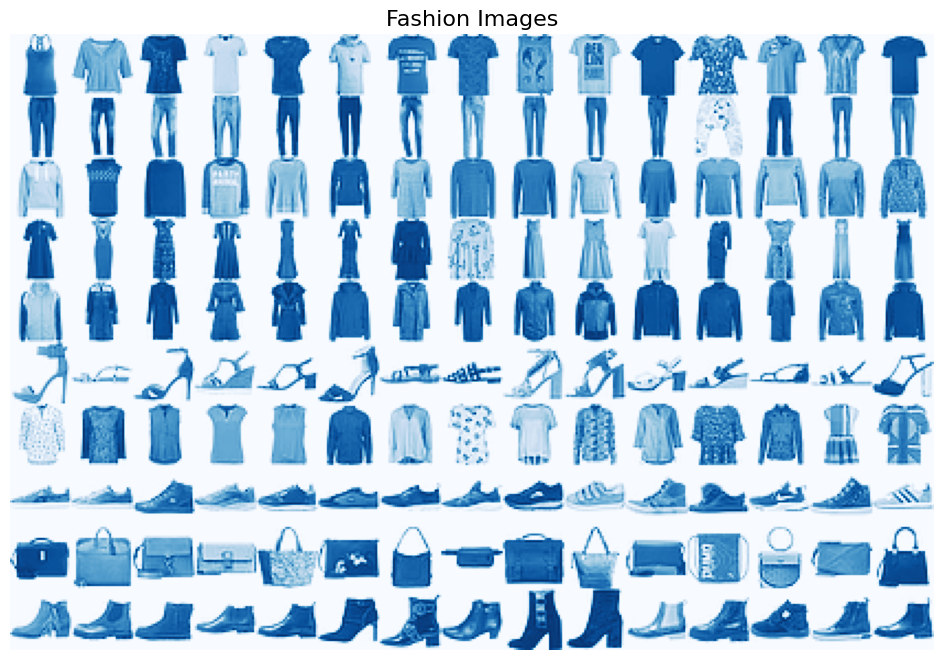

In [ ]:
classes = sorted(np.unique(train_labels).astype(int))
h = w = 28
n_samples = 15

fig, ax = plt.subplots(figsize=(18, 8))
fashion_sample = np.empty(shape=(h * len(classes),
                                 w * n_samples))

for row, label in enumerate(classes):
    label_idx = np.argwhere(train_labels == label).squeeze()
    sample_indices = np.random.choice(label_idx, size=n_samples, replace=False)
    i = row * h
    for col, sample_idx in enumerate(sample_indices):
        j = col * w
        sample = train_images[sample_idx].reshape(h, w)
        fashion_sample[i:i+h, j:j + w] = sample

ax.imshow(fashion_sample, cmap='Blues')
ax.set_title('Fashion Images', fontsize=16)
plt.axis('off')

Набор данных содержит изображения различных предметов одежды: футболки, штаны, кофты, платья, обувь различного вида, etc. Всего $10$ классов. Для меньших временных затрат будем использовать только данные из тестовой части исходного набора данных (всего $10$ тысяч объектов).

In [ ]:
X = test_images.reshape(len(test_images), -1)
y = test_labels

0

При помощи `train_test_split` разбейте набор данных на тренировочную и тестовую части в соотношении `80:20`. Используйте стратификацию по колонке отклика.

**Примечание:** здесь и далее для воспроизводимости результатов и корректного сравнения результатов экспериментов имеет смысл фиксировать `random_state`.

In [ ]:
train_X, test_X, train_Y, test_Y = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

Обучите модель `LogisticRegression` со следующими параметрами: `max_iter=2000, tol=0.001` на тренировочных данных. При помощи `f1_score` с параметром `average='weighted'` оцените модель на тестовых данных.

In [ ]:
reg = LogisticRegression(max_iter=2000, tol=0.001, random_state=42)

reg.fit(train_X, train_Y)

LogisticRegression(max_iter=2000, random_state=42, tol=0.001)

In [ ]:
pred = reg.predict(test_X)

f1_sc_metr = f1_score(test_Y, pred, average='weighted')
print(f"f1 score = {f1_sc_metr}")

f1 score = 0.7451025098831728


**Вопрос:** как работает `f1_score` и что показывает данная метрика? Опишите ее плюсы и минусы. Что означает параметр `average='weighted'`? Какие еще бывают параметры, зачем и когда они используются?

**Ваш ответ:**

1) `f1_score` - средне гармоническое между precision (показывает 1 - доля ошибок 2 рода), recall (показывает 1 - доля ошибок 1 рода).
Данная метрика выступает балансом между этими 2 характеристиками классификации
у нас есть набор тестовых и предсказанных меток, сравнивая их мы можем посчитать соответственно precision и recall, откуда можно высчитать f1-меру.
Или можно преобразовать в выражение вида
$$ f_{1} = \frac{2TP}{2TP+FP+FN}$$
`average='weighted'` учитывает количество образцов в каждом классе. считает метрику для каждого класса, а уже потом усредняет значения

`average='micro'`: Вычисляет глобальные TP, FP и FN по всем классам, а затем вычисляет F1 Score. Это означает, что все классы рассматриваются одинаково, и метрика может быть более чувствительной к классам с большим количеством образцов.

`average='macro'`: Вычисляет f1-мер для каждого класса отдельно и затем берет среднее значение. Все классы при этом считаются равными, что может привести к игнорированию классов с большим количеством образцов.
`average=None`: Возвращает f1-меру для каждого класса отдельно без усреднения.

Добавьте к тестовым данным шум при помощи `np.random.normal(X_test, scale)`, где `scale` $\in \{50,100,150,200\}$. Визуально оцените результаты.

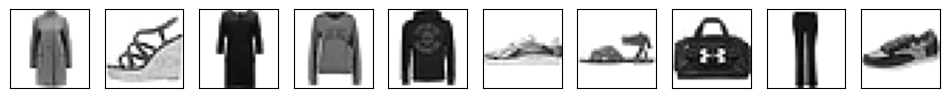

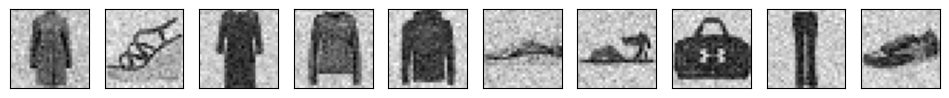

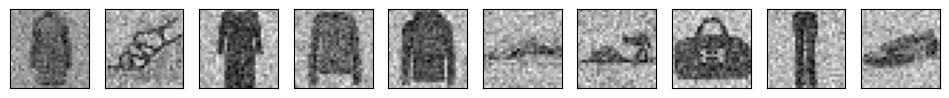

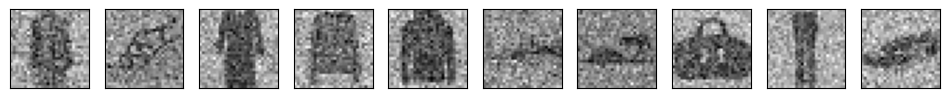

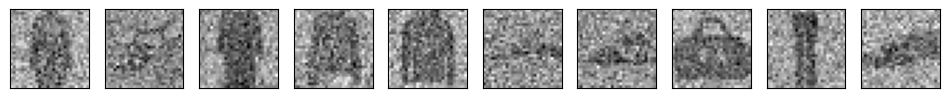

In [ ]:
for sc in tqdm(range(0, 201, 50)):

  test_X_noisy = test_X + np.random.normal(test_X, sc)
  fig, axes = plt.subplots(1, 10, figsize=(12, 7), subplot_kw={'xticks': [], 'yticks': []})

  for i, ax in enumerate(axes.flat):
      ax.imshow(test_X_noisy[i].reshape(28, 28), cmap=plt.cm.gray_r)

**Ваши выводы:** ###

Произведите предсказания для зашумленных тестовых данных. Оцените результат при помощи `f1_score` с параметром `average='weighted'`.

In [ ]:
for sc in range(0,201,50):

    X_test_noisy = test_X + np.random.normal(test_X, sc)
    y_predict = reg.predict(X_test_noisy)
    f1m= f1_score(test_Y, y_predict, average='weighted')
    print(f"для шума {sc}: f1_score = {f1m}")

для шума 0: f1_score = 0.7451025098831728
для шума 50: f1_score = 0.63593549651301
для шума 100: f1_score = 0.5103273290731469
для шума 150: f1_score = 0.44186201835028444
для шума 200: f1_score = 0.3678668963476863


**Ваши выводы:**
при ухудшении качества данных качество классификатора снижается

Попробуем избавиться от шума при помощи метода главных компонент.

Обучите модель `PCA(explained_variance)` на зашумленных тестовых данных, где `explained_variance` $\in [0.1, 0.9]$ с шагом $0.1$. Уменьшите размерность зашумленных тестовых данных, а затем при помощи `.inverse_transform()` "восстановите" данные до приближенных исходных.

In [ ]:
test_X.shape

(2000, 784)

In [ ]:
test_X[0].shape

(784,)

In [ ]:
model_pca = PCA(0.1)
test_X_noisy_reduced = model_pca.fit_transform(test_X_noisy)

In [ ]:
test_X_noisy_reduced.shape

(2000, 1)

In [ ]:
test_X_noisy_reduced[0]

array([196.81882306])

100%|██████████| 9/9 [00:30<00:00,  3.39s/it]


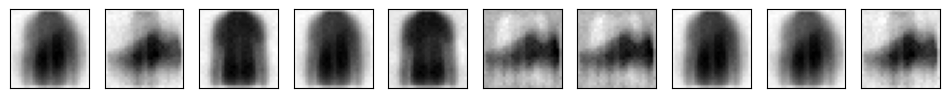

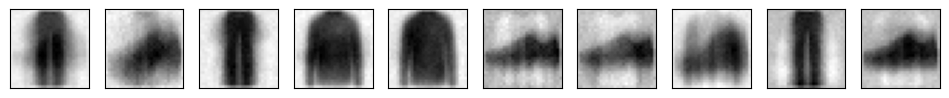

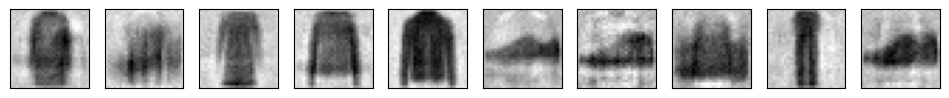

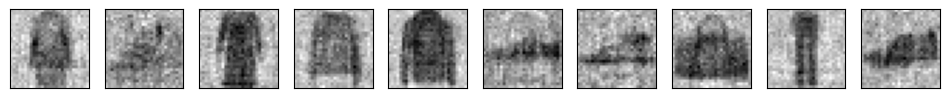

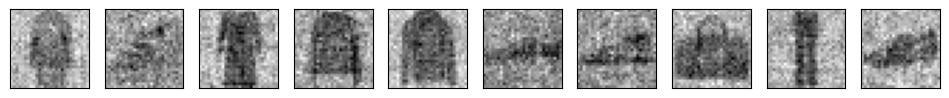

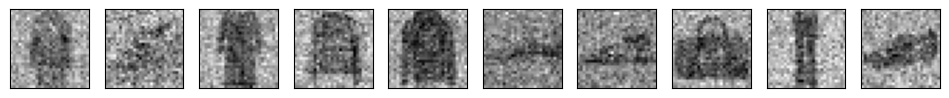

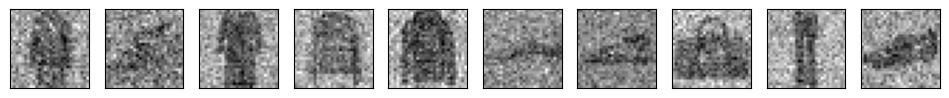

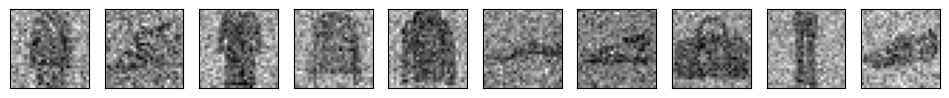

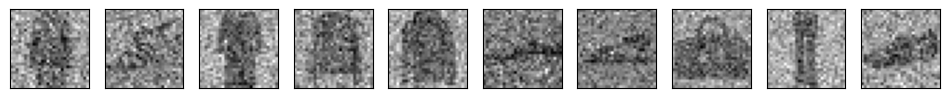

In [ ]:


test_X_noisy = test_X + np.random.normal(test_X, 200)

for expl_var in tqdm(np.arange(0.1, 1.0, 0.1)):

  model_pca = PCA(expl_var)

  test_X_noisy_reduced = model_pca.fit_transform(test_X_noisy)
  restored_X_test_noisy = model_pca.inverse_transform(test_X_noisy_reduced)

  fig, axes = plt.subplots(1, 10, figsize=(12, 7), subplot_kw={'xticks': [], 'yticks': []})

  for i, ax in enumerate(axes.flat):
      ax.imshow(restored_X_test_noisy[i].reshape(28, 28), cmap=plt.cm.gray_r)

**Ваши выводы:**
Основные черты одежды видны уже при малой количестве используемый главных компонент. Далее, как на примере первого столбца, картинка может восстанавливать шум, что искажает картинку. Стоит пробовать диапазон explained variance при избавлении от шума для понимания картинки.

Произведите предсказания для очищенных от шума данных. Оцените результат при помощи `f1_score` с параметром `average='weighted'`.

In [ ]:
pred_restored_expl_var_0_9 = reg.predict(restored_X_test_noisy)

f1_sc_metr = f1_score(test_Y, pred_restored_expl_var_0_9, average='weighted')
print(f"f1 score = {f1_sc_metr}")

f1 score = 0.39301321246292553


В качестве результата **НАГЛЯДНО** представьте получаемые значения `f1_score` в зависимости от используемого уровня шума и доли объясненной дисперции (таблицы, графики, диаграммы). Сделайте выводы.

In [ ]:
noise_levels = range(0, 201, 50)
explained_variance_ratios = [i/10 for i in range(1,10)]

# Результаты для хранения F1-меры
results = {}

for noise in noise_levels:
    for evr in explained_variance_ratios:
        X_test_noisy = test_X + np.random.normal(test_X, noise)

        pca = PCA(n_components=evr,svd_solver = 'full')
        X_train_pca = pca.fit_transform(train_X)
        X_test_pca = pca.transform(X_test_noisy)

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_pca)
        X_test_scaled = scaler.transform(X_test_pca)

        model = LogisticRegression(max_iter=2000, tol=0.001)
        model.fit(X_train_scaled, train_Y)

        y_pred = model.predict(X_test_scaled)
        f1 = f1_score(test_Y, y_pred, average='weighted')

        # Сохранение результата
        results[(noise, evr)] = f1

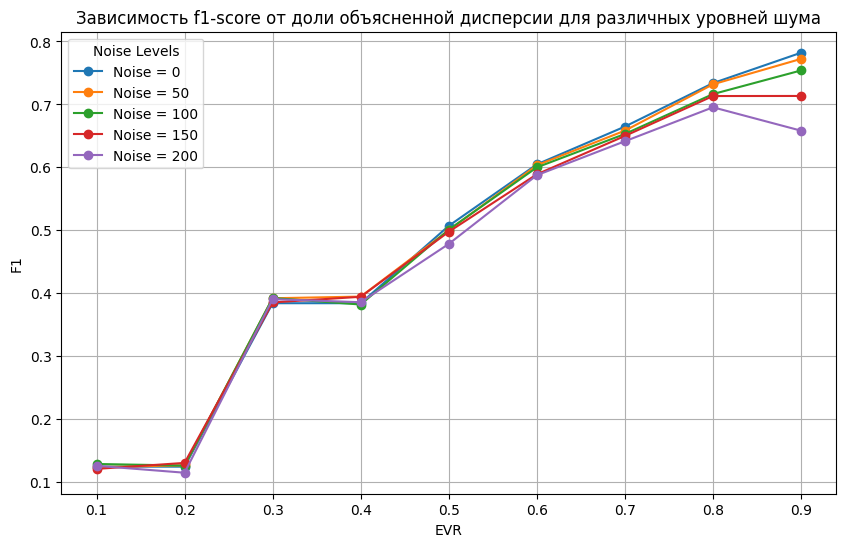

In [ ]:
# Организация данных
noise_levels = sorted(set(noise for noise, evr in results.keys()))
evr_levels = sorted(set(evr for noise, evr in results.keys()))

# Создание графика
plt.figure(figsize=(10, 6))

for noise in noise_levels:
    evr_values = []
    f1_values = []

    for evr in evr_levels:
        f1 = results.get((noise, evr), None)
        if f1 is not None:
            evr_values.append(evr)
            f1_values.append(f1)

    plt.plot(evr_values, f1_values, marker='o', label=f'Noise = {noise}')

# Настройка графика
plt.title('Зависимость f1-score от доли объясненной дисперсии для различных уровней шума')
plt.xlabel('EVR')
plt.ylabel('F1')
plt.legend(title='Noise Levels')
plt.grid()
plt.show()

**Ваши выводы:**

Как уже говорилось раннее, модель восстанавливет шум и начинает учить его при выборе слишком большой объясненной дисперсии

# t-SNE

В этом блоке вам предстоит выполнить задания, касающиеся `t-SNE`.

## Теоретическая часть

Напомним, что расстояние Кульбака--Лейблера между двумя распределенями $P = \{p_1, \ldots, p_n\}$, $Q = \{q_1, \ldots, q_n\}$ вычисляется как
$$
\mathbb{KL}(P|Q) = \sum\limits_{i=1}^np_i \log \frac{p_i}{q_i}.
$$

Пусть перплексия равна $k$. Положите $p_{i|j} = 1/k$ для $k$ ближайших соседей точки $j$ за исключением $j$, $p_{j|j} = 0$, как и остальные вероятности. Положите
$$
p_{ij} = \frac{p_{i|j} + p_{j|i}}{2n}.
$$

## Задача 1

Вычислите градиент $\mathbb{KL}$ в случае использования `SNE` и `t-SNE`.

###**Ваш ответ:**

###для SNE:

$$
\mathbb{KL}(P|Q) = \sum\limits_{i=1}^n \sum\limits_{j=1}^n p_{ij} \log \frac{p_{ij}}{q_{ij}} = \sum\limits_{i=1}^n \sum\limits_{j=1}^n p_{ij} \log p_{ij} - p_{ij} \log q_{ij}
$$

$$
p_{i|j} =
\begin{cases}
1/k & \quad \text{when $p_{j} \in \{nearest\ k\ neighbors\ of\ p_{i}\}$}\\
0 & \quad \text{otherwise}
\end{cases} \\
p_{ij} = \frac{p_{i|j} + p_{j|i}}{2n}
$$

$$
q_{ij} = \frac{\exp(-||y_i-y_j)}{\sum\limits_{k} \sum\limits_{l \neq k } \exp(-||y_l-y_k)} = \frac{E_{ij}}{Z}
$$

Для удобства записи опустим $\partial{y_i}$:

$$
\frac{\partial{KL}}{\partial{y_i}} = \sum\limits_{i=1}^n \sum\limits_{j=1}^n -p_{ij} \partial{\log E_{ij}} + p_{ij} \partial{\log Z}
$$

Рассмотрим отдельно каждое слагаемое:

$$
\sum\limits_{i=1}^n \sum\limits_{j=1}^n -p_{ij} \partial{\log E_{ij}} = \sum\limits_{j\neq i} -p_{ij} \log E_{ij} - p_{ji} \log E_{ji} = \sum\limits_{j\neq i} -\frac{E_{ij}}{E_{ij}}p_{ij}(-2(y_i-y_j)) -\frac{E_{ji}}{E_{ji}}p_{ji}(-2(y_i-y_j)) = \sum\limits_{j\neq i} 4p_{ij}(y_i-y_j)
$$

$$
\sum\limits_{i=1}^n \sum\limits_{j=1}^n p_{ij} \partial{\log Z} = \partial{\log Z} \sum\limits_{i=1}^n \sum\limits_{j=1}^n p_{ij} = \partial{\log Z} =  \sum\limits_{j\neq i} -2(y_i-y_j)\frac{E_{ij}}{Z} - 2(y_i - y_j)\frac{E_{ji}}{Z} = \sum\limits_{j\neq i} -2(y_i-y_j)q_{ij} - 2(y_i - y_j)q_{ji} = -4 \sum\limits_{j\neq i} (y_i-y_j)q_{ij}
$$

Итоговая комбинация слагаемых градиента SNE:

$$
\frac{\partial{\mathbb{KL_{SNE}}}}{\partial{y_i}} = 4 \sum\limits_{i \neq j}(p_{ij} - q_{ij})(y_i-y_j)
$$

###для t-SNE:

$$
\mathbb{KL}(P|Q) = \sum\limits_{i=1}^n \sum\limits_{j=1}^n p_{ij} \log \frac{p_{ij}}{q_{ij}} = \sum\limits_{i=1}^n \sum\limits_{j=1}^n p_{ij} \log p_{ij} - p_{ij} \log q_{ij}
$$

$$
p_{i|j} =
\begin{cases}
1/k, & \quad \text{где $p_{j} \in \{nearest\ k\ neighbors\ of\ p_{i}\}$}\\
0, & \quad \text{иначе}
\end{cases} \\
p_{ij} = \frac{p_{i|j} + p_{j|i}}{2n}
$$


$$
q_{ij} = \frac{\frac{1}{1+||y_i - y_j||^2}}{\sum\limits_{k} \sum\limits_{l \neq k } \frac{1}{1+||y_k - y_l||^2}} = \frac{E_{ij}^{-1}}{Z}
$$

$$
\frac{\partial{KL}}{\partial{y_i}} = \sum\limits_{i=1}^n \sum\limits_{j=1}^n -p_{ij} \partial{\log E_{ij}^{-1}} + p_{ij} \partial{\log Z}
$$

$$
\sum\limits_{i=1}^n \sum\limits_{j=1}^n -p_{ij} \partial{\log E_{ij}^{-1}} = -2 \sum\limits_{j\neq i}p_{ij} \frac{E_{ij}^{-2}}{E_{ij}^{-1}}(-2(y_i-y_j)) = 4\sum\limits_{j\neq i} p_{ij} E_{ij}^{-1} (y_i - y_j)
$$

$$
\sum\limits_{i=1}^n \sum\limits_{j=1}^n p_{ij} \partial{\log Z} = \partial{\log Z} = \frac{1}{Z} \sum\limits_{i} \sum\limits_{j\neq i} \partial{E_{ij}^{-1}} = 2 \sum\limits_{j\neq i} \frac{E_{ij}^{-2}}{Z} (-2(y_i-y_j)) = -4 \sum\limits_{j\neq i} q_{ij} E_{ij}^{-1} (y_i - y_j)
$$

Итоговая комбинация слагаемых градиента t-SNE:

$$
\frac{\partial{\mathbb{KL_{t-SNE}}}}{\partial{y_i}} = 4 \sum\limits_{j \neq i}(p_{ij} - q_{ij})E_{ij}^{-1}(y_i-y_j) = 4 \sum\limits_{j \neq i}(p_{ij} - q_{ij})(1+||y_i - y_j||^2)^{-1}(y_i-y_j)
$$

## Задача 2.1

В условиях предыдущей задачи самостоятельно реализуйте алгоритмы `SNE` и `t-SNE`. Проведите численные эксперименты для следующего набора данных:

In [ ]:
link = 'https://courses.openedu.ru/assets/courseware/v1/6c89dd85d23926d43494d0e4dd968840/asset-v1:ITMOUniversity+INTROMLADVML+fall_2023_ITMO_mag+type@asset+block/94_16.csv'
data = pd.read_csv(link, header = None)
data.head(3)

,0,1,2,3,4,5,6,7,8,9
0,10.382991,-14.438544,-23.950798,-17.809813,2.480495,-15.743114,-9.112421,-27.390035,-11.955001,18.069910
1,18.987842,-13.071734,15.619164,-11.288528,-11.624820,14.845464,-4.924935,21.207876,-23.703025,4.440474
2,7.426000,-9.236580,-21.139348,6.732592,0.447684,-20.687020,-18.545136,7.758288,18.620790,-3.006755


In [ ]:
data.shape

(60, 10)

In [ ]:
class SNE_tSNE():

  def __init__(self, n_components=2, perplexity = 30, n_iter = 2000, lr = .01, is_tsne=False, is_P_knn = True, to_show_grad = False):
      self.n_components = n_components
      self.perplexity = perplexity
      self.n_iter = n_iter
      self.lr = lr
      self.is_tsne = is_tsne
      self.is_P_knn = is_P_knn
      self.to_show_grad = to_show_grad


  def comp_P_knn(self, X):
    self.P_ = np.zeros((self.count_points, self.count_points))
    for i in range(self.count_points):
        dists = np.linalg.norm(X - X.iloc[i], axis=1)
        knn_indices = np.argsort(dists)[1 : self.perplexity+1]
        self.P_[i, knn_indices] = 1/self.perplexity
    self.P = (self.P_ + self.P_.T)/(2*self.count_points)


  def comp_P_exp(self, X):
    self.P = np.zeros((self.count_points, self.count_points))
    for i in range(self.count_points):
        dif_X = X.iloc[i] - X
        dists = np.linalg.norm(dif_X, axis=1)
        self.P[i] = np.exp(-(dists ** 2)/(2*self.perplexity))
        self.P[i] /= np.sum(self.P[i])
    self.P = (self.P + self.P.T)/2/self.count_points


  def comp_Q(self):
    self.Q = np.zeros((self.count_points, self.count_points))
    grad = np.zeros((self.count_points, self.n_components))
    for i in range(self.count_points):
        dif_Y = self.Y[i] - self.Y
        dists = np.linalg.norm(dif_Y, axis=1)
        if self.is_tsne:
            self.Q[i] = 1 / (1 + dists ** 2)
        else:
            self.Q[i] = np.exp(-(dists ** 2))
        grad[i] = (self.P[i] - self.Q[i]) @ dif_Y
    self.Q /= np.sum(self.Q)
    self.Y -= self.lr*4*grad
    self.grads.append(grad[0][0])


  def fit_transform(self, X, y=None):
      self.grads = []
      history = []
      self.count_points = X.shape[0]

      if self.is_P_knn:
          self.comp_P_knn(X)
      else:
          self.comp_P_exp(X)

      np.random.seed(42)
      self.Y = np.random.rand(self.count_points, self.n_components)
      for k in tqdm(range(self.n_iter)):
          self.comp_Q()
          history.append(self.Y.copy())

      if self.to_show_grad:
          plt.figure()
          plt.plot(np.linspace(0, self.n_iter - 1, self.n_iter), self.grads)
          if self.is_tsne:
            plt.title("Grad t-SNE of some element")
          else:
            plt.title("Grad SNE of some element")
          plt.show()

      return self.Y.copy(), history

In [ ]:
sne_model = SNE_tSNE(n_components=2, perplexity = 10, n_iter = 300, lr = 1, is_P_knn=True, is_tsne=False, to_show_grad = True)
t_sne_model = SNE_tSNE(n_components=2, perplexity = 10, n_iter = 300, lr = 1, is_P_knn=True, is_tsne=True, to_show_grad = True)

In [ ]:
np.random.seed(42)
old_generated_cords = np.random.rand(data.shape[0], 2)

100%|██████████| 300/300 [00:00<00:00, 733.95it/s]


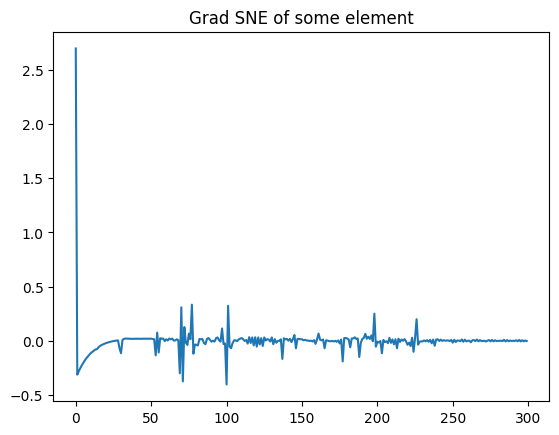

100%|██████████| 300/300 [00:00<00:00, 665.49it/s]


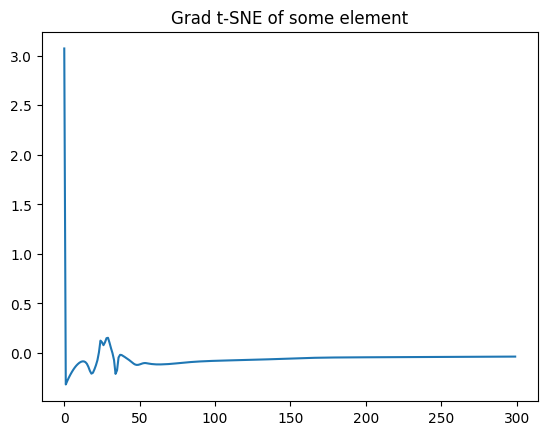

In [ ]:
new_cords_sne, hist_sne = sne_model.fit_transform(data)
new_cords_tsne, hist_tsne = t_sne_model.fit_transform(data)

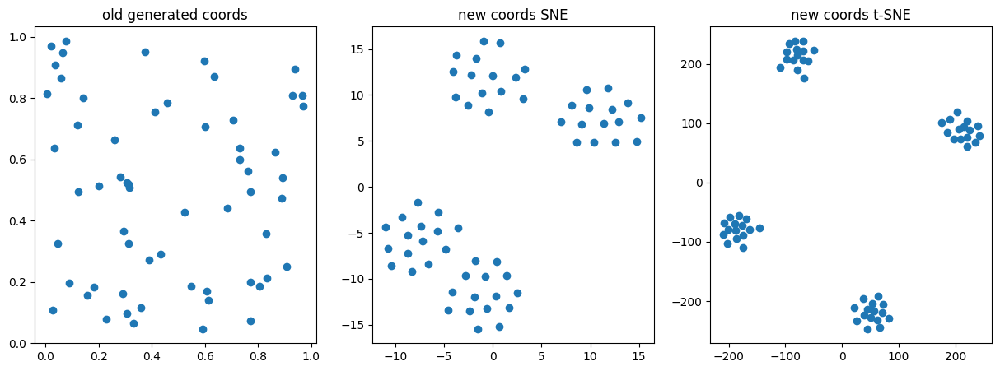

In [ ]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.scatter(old_generated_cords[:, 0], old_generated_cords[:, 1])
plt.title('old generated coords')
# plt.pause(2)
plt.subplot(1, 3, 2)
plt.scatter(new_cords_sne[:, 0], new_cords_sne[:, 1])
plt.title('new coords SNE')

plt.subplot(1, 3, 3)
plt.scatter(new_cords_tsne[:, 0], new_cords_tsne[:, 1])
plt.title('new coords t-SNE')

plt.show()

In [ ]:
for i in tqdm(range(len(hist_sne))):
  plt.scatter(x=hist_sne[i][:,0], y=hist_sne[i][:,1])
  plt.savefig('imgs/sne/step_'+str(i)+'.png')
  plt.close()

  plt.scatter(x=hist_tsne[i][:,0], y=hist_tsne[i][:,1])
  plt.savefig('imgs/tsne/step_'+str(i)+'.png')
  plt.close()


100%|██████████| 300/300 [01:45<00:00,  2.86it/s]


In [ ]:
!mkdir imgs
!mkdir imgs/sne
!mkdir imgs/tsne

In [ ]:
images_sne = []
images_tsne = []

for idx in tqdm(range(len(hist_sne))):
    filename_sne = 'imgs/sne/step_'+str(idx)+'.png'
    images_sne.append(imageio.imread(filename_sne))
    filename_tsne = 'imgs/tsne/step_'+str(idx)+'.png'
    images_tsne.append(imageio.imread(filename_tsne))

imageio.mimsave('movie_sne.gif', images_sne)
imageio.mimsave('movie_tsne.gif', images_tsne)

  0%|          | 0/300 [00:00<?, ?it/s]<ipython-input-15-f23abbe82637>:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images_sne.append(imageio.imread(filename_sne))
<ipython-input-15-f23abbe82637>:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images_tsne.append(imageio.imread(filename_tsne))
100%|██████████| 300/300 [00:05<00:00, 50.14it/s]


In [ ]:
imageio.mimsave('movie_sne.gif', images_sne)

In [ ]:
imageio.mimsave('movie_tsne.gif', images_tsne)

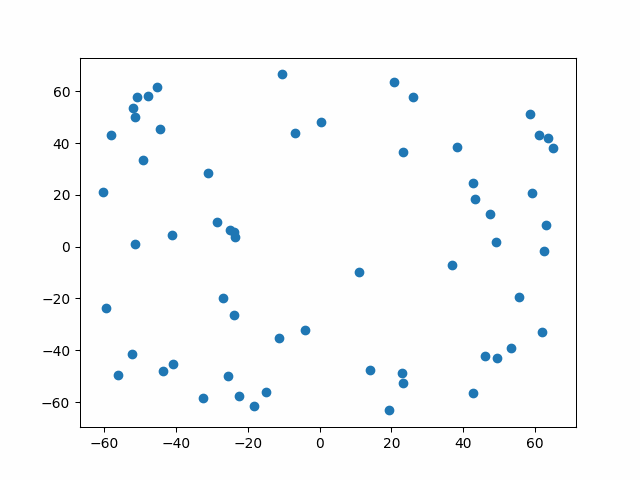

In [ ]:
Image(open('/content/movie_sne.gif','rb').read())

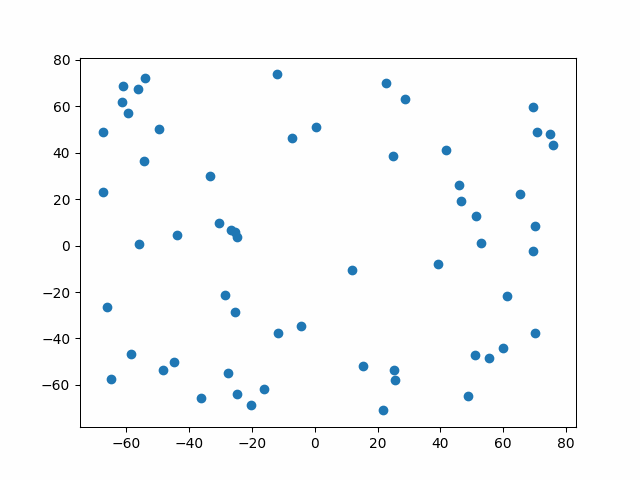

In [ ]:
Image(open('/content/movie_tsne.gif','rb').read())

**НАГЛЯДНО** представьте получаемые результаты (визуализации, время работы, анимация, etc) в зависимости от используемого метода (`SNE`/`t-SNE`) и значения перплексии. Сделайте выводы.

**Замечание:** В качестве способа минимизации функции потерь можно использовать либо самостоятельно реализованный градиентный спуск, либо некоторую библиотечную оптимизацию, использующую вычисленные вами в предыдущей задаче градиенты функций потерь. Например, на основе `scipy.optimize.minimize`.

In [ ]:
# @title Пример использования scipy.optimize.minimize
import numpy as np
from scipy.optimize import minimize

# Пусть минимизируемая функция имеет вид $(x-2)^2 + (y+1)^2$
# Начальная точка
x0 = np.array([5,8])

# Для вычисления точки минимума в функцию minimize подается
# cама минимизируемая функция и ее градиент
def f_and_grad(point):
  x,y = point
  f = (x-2)**2 + (y+1)**2
  grad = np.array([2*(x-2), 2*(y+1)])
  return f, grad


# Чтобы функция minimize использовала именно наш градиент
# устанавливаем соответствующий параметр jac=True
minimize(f_and_grad, x0, jac=True)

  message: Optimization terminated successfully.
  success: True
   status: 0
      fun: 6.2960960997952e-29
        x: [ 2.000e+00 -1.000e+00]
      nit: 4
      jac: [ 1.510e-14 -4.885e-15]
 hess_inv: [[ 9.500e-01 -1.500e-01]
            [-1.500e-01  5.500e-01]]
     nfev: 5
     njev: 5

In [ ]:
t1 = []
t2 = []
t3 = []
t4 = []

res_sne = []
res_tsne = []
res_box_tsne1 = []
res_box_tsne2 = []

for perp in range(1,50,1):
    sne_model = SNE_tSNE(n_components=2, perplexity = perp, n_iter = 2000, lr = 1, is_tsne=False, to_show_grad = False)
    tsne_model = SNE_tSNE(n_components=2, perplexity = perp, n_iter = 2000, lr = 1, is_tsne=True, to_show_grad = False)

    start_time = time.time()
    sne_results, _ = sne_model.fit_transform(data)
    end_time = time.time()
    time_1 = end_time - start_time

    start_time = time.time()
    tsne_results, _ = tsne_model.fit_transform(data)
    end_time = time.time()
    time_2 = end_time - start_time

    start_time = time.time()
    tsne_results_box1 = TSNE(perplexity=perp, max_iter=2000, init = 'random').fit_transform(data)
    end_time = time.time()
    time_3 = end_time - start_time

    start_time = time.time()
    tsne_results_box2 = TSNE(perplexity=perp, max_iter=2000, init = 'pca').fit_transform(data)
    end_time = time.time()
    time_4 = end_time - start_time

    res_sne.append(sne_results)
    res_tsne.append(tsne_results)
    res_box_tsne1.append(tsne_results_box1)
    res_box_tsne2.append(tsne_results_box2)

    t1.append(time_1)
    t2.append(time_2)
    t3.append(time_3)
    t4.append(time_4)

100%|██████████| 2000/2000 [00:02<00:00, 709.91it/s]


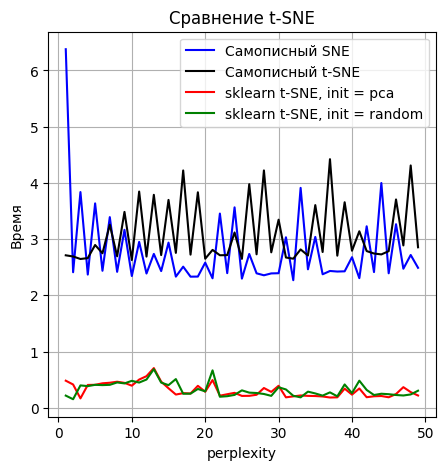

In [ ]:
t_x = range(1,50)
plt.figure(figsize=(5, 5))
plt.plot(t_x, t1, label='Самописный SNE', color='blue')
plt.plot(t_x, t2, label='Самописный t-SNE', color='black')
plt.plot(t_x, t3, label='sklearn t-SNE, init = pca', color='red')
plt.plot(t_x, t4, label='sklearn t-SNE, init = random', color='green')
plt.grid(True)
plt.title('Сравнение t-SNE')
plt.xlabel('perplexity')
plt.ylabel('Время')
plt.legend()

# Показ графика
plt.show()


Из графиков можно сделать вывод, что параметр perplexity прямопропорционально влияет количество ближайших точек, участвующих в локальном распределении.

При этом SNE работает быстрее, чем t-SNE. Но t-SNE обеспечивает большую кучность и при увеличении perplexity может делать разделение более сложных геометрий.

## Задача 2.2

Используя набор данных из Задачи 2.1 и [библиотечную реализацию t-SNE](https://opentsne.readthedocs.io/en/latest/api/sklearn.html), произведите численные эксперименты. Обратите особое внимание на следующие параметры: `perplexity, early_exaggeration, exaggeration, initialization, dof`. Сравните время работы и получаемые результаты с результатами Задачи 2.1. Сделайте выводы.

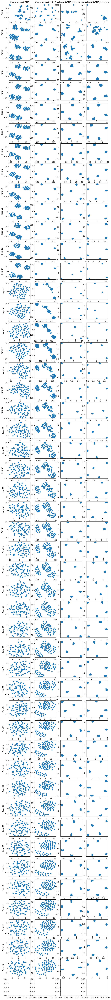

In [ ]:
#plot all

fig, axs = plt.subplots(50, 4, figsize=(10,100))
axs[0, 0].set_title('Самописный SNE')
axs[0, 1].set_title('Самописный t-SNE')
axs[0, 2].set_title('sklearn t-SNE, init=random')
axs[0, 3].set_title('sklearn t-SNE, init=pca')

for i in range(0, len(res_sne), 1):

    axs[i,0].scatter(res_sne[i][:, 0], res_sne[i][:, 1])
    axs[i,0].set_ylabel("Perp " + str(i+1))

    axs[i,1].scatter(res_tsne[i][:, 0], res_tsne[i][:, 1])

    axs[i,2].scatter(res_box_tsne1[i][:, 0], res_box_tsne1[i][:, 1])

    axs[i,3].scatter(res_box_tsne2[i][:, 0], res_box_tsne2[i][:, 1])

plt.show()

In [ ]:
X = data.values


res={}
for perp in tqdm(range(5,50)):
    for exg in range(10,51,5):
        start_time = time.time()

        tsne = TSNE(
            perplexity=perp,
            early_exaggeration=exg,
            random_state=42
        )

        X_embedded = tsne.fit_transform(X)
        elapsed_time = time.time() - start_time
        res[(perp,exg)]=elapsed_time
        # results.append((param, X_embedded, elapsed_time))

100%|██████████| 45/45 [02:06<00:00,  2.82s/it]


100%|██████████| 9/9 [00:00<00:00, 401.63it/s]


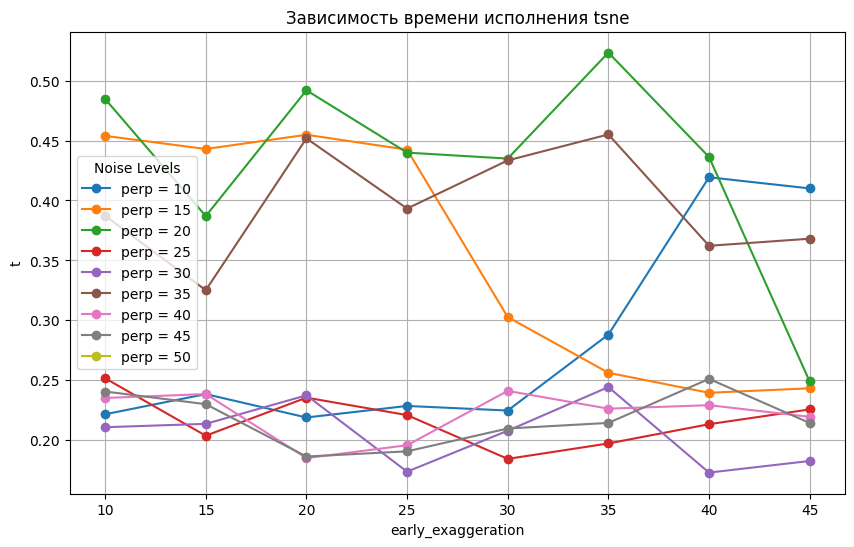

In [ ]:
# Организация данных
param1 = sorted(set(key1 for key1, key2 in res.keys()))
param2 = sorted(set(key2 for key1, key2 in res.keys()))

# Создание графика
plt.figure(figsize=(10, 6))

for noise in tqdm(param2):
    evr_values = []
    values = []

    for evr in param1:
        f1 = res.get((noise, evr), None)
        if f1 is not None:
            evr_values.append(evr)
            values.append(f1)

    plt.plot(evr_values, values, marker='o', label=f'perp = {noise}')

# Настройка графика
plt.title('Зависимость времени исполнения tsne')
plt.xlabel('early_exaggeration')
plt.ylabel('t')
plt.legend(title='Noise Levels')
plt.grid()
plt.show()


100%|██████████| 5/5 [00:08<00:00,  1.61s/it]


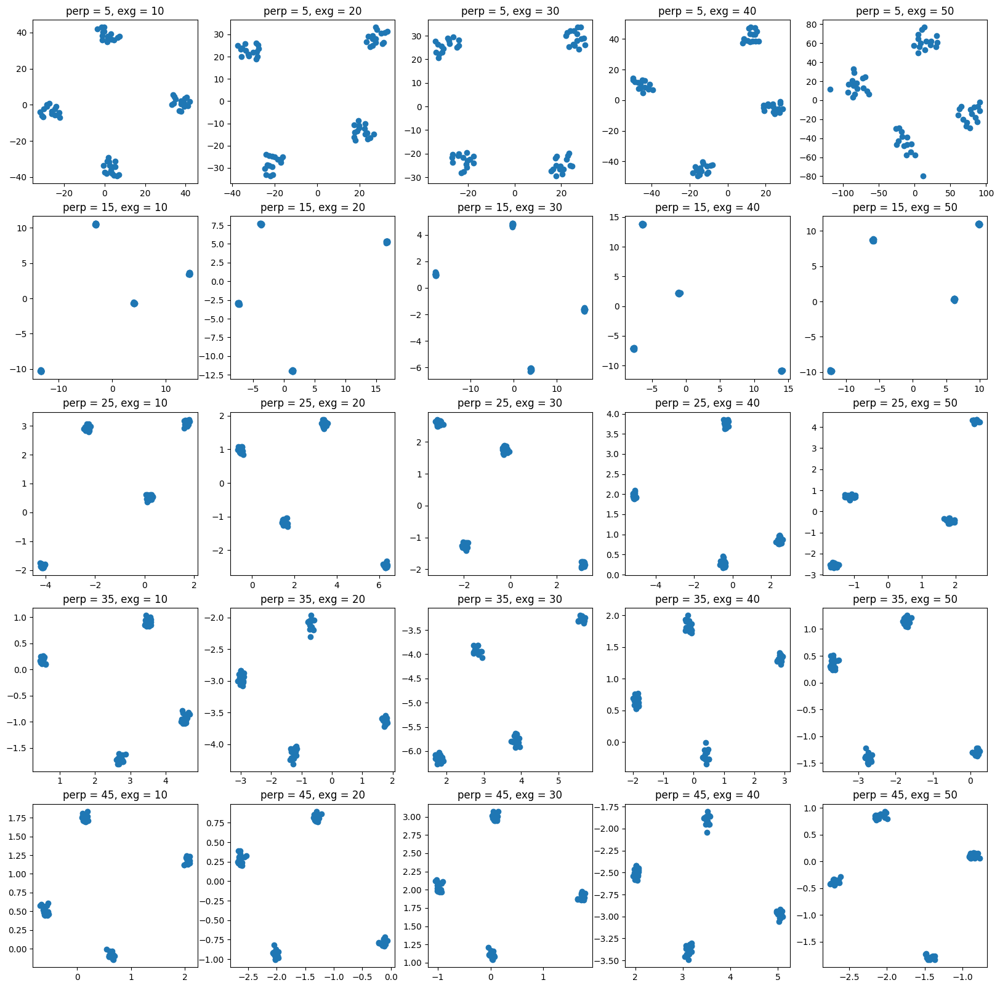

In [ ]:
# plt.figure(figsize=(20, 20))
fig, axs = plt.subplots(5, 5, figsize=(20, 20))
for ind1, perp in enumerate(tqdm(range(5,50,10))):
    for ind2, exg in enumerate(range(10,51,10)):
        start_time = time.time()

        tsne = TSNE(
            perplexity=perp,
            early_exaggeration=exg,
            random_state=42,
            init = 'pca'
        ).fit_transform(X)

        ax = axs[ind1, ind2 % 5]
        ax.scatter(tsne[:, 0], tsne[:, 1])
        ax.set_title(f'perp = {perp}, exg = {exg}')
        # ax.set_xlabel('TSNE Component 1')
        # ax.set_ylabel('TSNE Component 2')
plt.show()

Параметры perplexity и early_exaggeration влияют на кучность полученных кластеров (чем больше параметры тем они кучнее), а также влияют на их взаимное распроложение

## Задача 3

Проверьте свои выводы о влиянии рассмотренных в Задаче 2.2 параметров на результат, используя более объемный, как с точки зрения количества объектов, так и с точки зрения количества признаков, датасет на свой выбор.

In [ ]:
from sklearn.datasets import fetch_openml

In [ ]:
mnist = fetch_openml('mnist_784')
X = mnist.data
y = mnist.target.astype(int)
X_sample = X[:1000]
X.shape

(70000, 784)

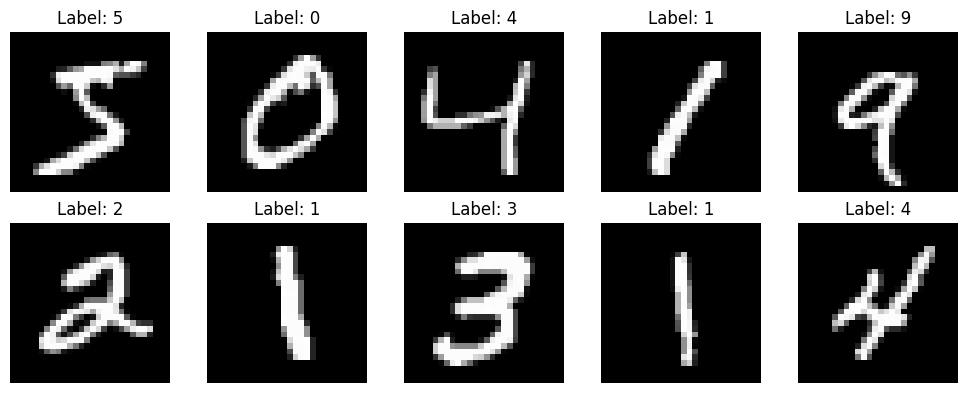

In [ ]:
plt.figure(figsize=(10, 4))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(X.iloc[i].values.reshape(28, 28), cmap='gray')
    plt.title(f'Label: {y[i]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:

initializations = ['random', 'pca']  # Инициализация

results = []
for ind1, perp in enumerate(tqdm(range(5,50,10))):
    for ind2, exg in enumerate(tqdm(range(10,55,10))):
        for init in initializations:
            start_time = time.time()

            # Выполнение t-SNE
            tsne = TSNE(
                perplexity=perp,
                early_exaggeration=exg,
                init=init,
                max_iter=3001,
                random_state=42
            ).fit_transform(X_sample)

            elapsed_time = time.time() - start_time

            # Сохранение результатов
            results.append({
                'perplexity': perp,
                'early_exaggeration': exg,
                'initialization': init,
                'time': elapsed_time,
                'index_':[ind1,ind2],
                'tsne_result': tsne,
                'labels': y[:1000]  # Сохраняем метки для визуализации
            })


100%|██████████| 5/5 [21:03<00:00, 252.62s/it]


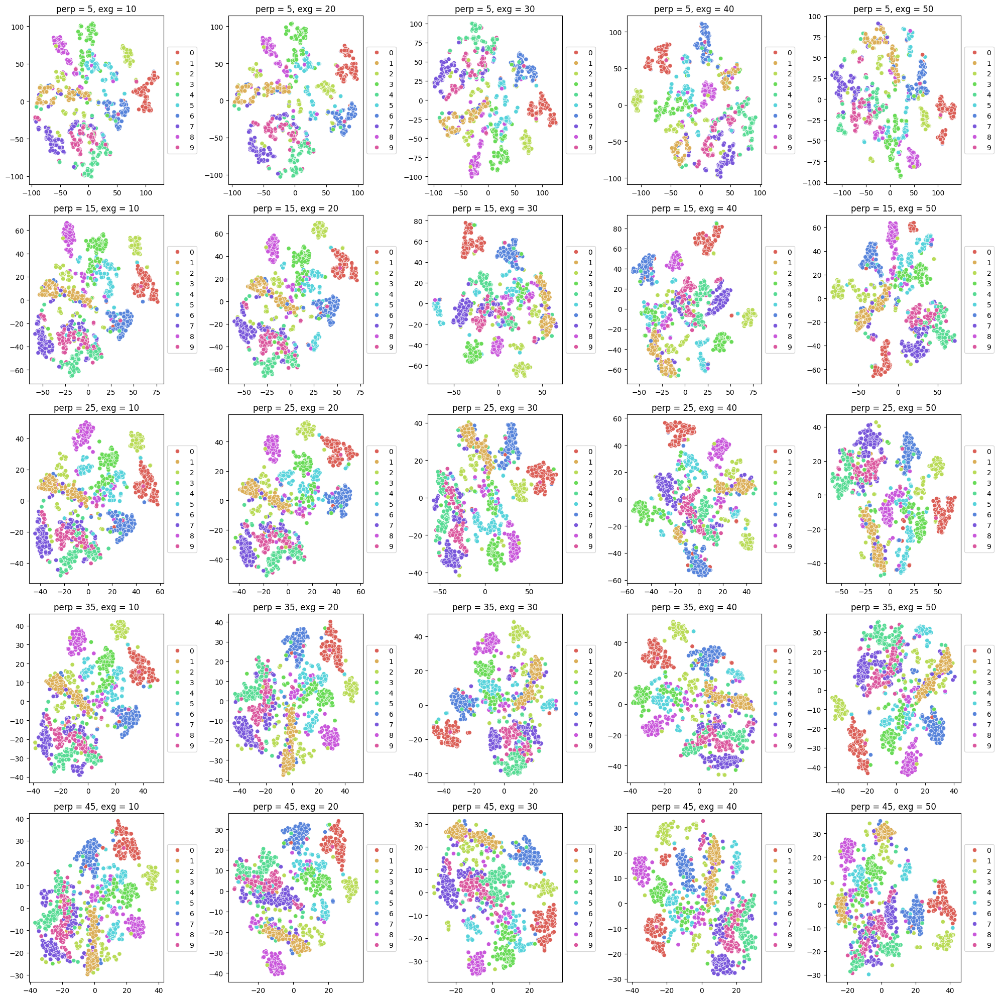

In [ ]:
fig, axs = plt.subplots(5, 5, figsize=(20, 20))
for result in results:
    if result['initialization'] == 'random':
        continue
    tsne = result['tsne_result']
    ind1, ind2 = result['index_']
    ax = axs[ind1, ind2 % 5]

    # sns.barplot(ax=axes[1], x=charmander.index, y=charmander.values)
    sns.scatterplot(ax=ax, x=tsne[:, 0], y=tsne[:, 1], hue=y[:1000], palette=sns.color_palette("hls", 10))
    # scatter = ax.scatter(tsne[:, 0], tsne[:, 1], c=y[:1000], cmap='CMRmap', s=5)

    ax.set_title(f"perp = {result['perplexity']}, exg = {result['early_exaggeration']}")
    # plt.colorbar(scatter, ax=ax, label='Wine Class')

plt.tight_layout()
plt.show()